In [1]:
pip install lmfit

Note: you may need to restart the kernel to use updated packages.


In [2]:
# debugging by fix the calculation of initial mgr 

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from scipy.interpolate import splrep, splev
from scipy.optimize import least_squares
from sklearn.metrics import r2_score
import random 

In [4]:
df_12 = pd.read_excel('/Users/liucheng/Desktop/Internship/Old_data Matti/raw data/timeseries 12C.xlsx', sheet_name=None,header=None)

/Users/liucheng/opt/anaconda3/envs/quant/lib/python3.9/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [5]:
def plot_time_x(df,sheet_name):
    
    df_sheet = df[sheet_name].copy()
    x = df_sheet.iloc[2,2:].reset_index(drop=True)
    #print(x)
    return x

In [6]:
def remove_redundant_time(df,sheet_name):
    df_sheet = df[sheet_name]
    df_sheet.drop(df_sheet.index[::2], inplace=True)
    return df_sheet
    
def cleaned_df(df,sheet_name):
    processed_df = remove_redundant_time(df,sheet_name)
    processed_df=  processed_df.drop(processed_df.columns[1],axis = 1)
    processed_df = processed_df.reset_index(drop=True)
    # reset the index of the remaining cols
    processed_df['new_index']=range(len(processed_df))
    # set the new index col as the actual index
    processed_df.set_index('new_index',drop=True,inplace =True)
    custom_name = f'{sheet_name}_processed'
    return {custom_name :processed_df}   

In [7]:
cleaned_df(df_12,'MB')

{'MB_processed':                0  2        3        4        5        6        7        8  \
 new_index                                                                   
 0           1A01  0  0.00230  0.00315  0.01385  0.07365  0.11290  0.12940   
 1           3B05  0  0.00160  0.00150  0.00145  0.00130  0.00135  0.00150   
 2           3C02  0  0.00110  0.00170  0.01190  0.05315  0.14060  0.14235   
 3           3D04  0  0.00115  0.00135  0.00250  0.01005  0.01700  0.02360   
 4           3D05  0  0.00140  0.00245  0.01445  0.11270  0.16520  0.22235   
 ...          ... ..      ...      ...      ...      ...      ...      ...   
 91         G2R07  0  0.00120  0.00115  0.00110  0.00105  0.00100  0.00140   
 92         G2R13  0  0.00155  0.00160  0.00175  0.00235  0.00255  0.00335   
 93         G2R14  0  0.00155  0.00660  0.00755  0.01315  0.01405  0.01505   
 94         G3M07  0  0.00875  0.01120  0.03225  0.14095  0.17015  0.19530   
 95         G3M13  0  0.00010  0.00370  0.00410 

In [8]:
def transposed_df(df,sheet_name):
    df_sheet = df[sheet_name]
    # transpose the df without setting the first col as the index
    df_transposed = df_sheet.T.reset_index()
    #print(df_transposed)
    # set the first row as the col names
    df_transposed.columns = df_transposed.iloc[0]
    # drop the redundant first row
    df_transposed = df_transposed.iloc[2:].reset_index(drop=True)
    df_transposed =df_transposed.drop(df_transposed.columns[0],axis = 1)
    return df_transposed

In [9]:
a=transposed_df(df_12,'MB')

In [10]:
def plot_data(df, sheet_name):
    # extracted the desired sheet from the dictionary
    df_sheet = df[sheet_name]
    
    
    #transpose the df to have 'time (days)' as index
    df_transposed = df_sheet.set_index('time (days)').T
    
    print(df_transposed)

    unique_time_values = df_transposed.iloc[:,0].unique()
    print(unique_time_values)

#     # plot each group separately
#     for col in df_transposed.columns:
#         if 'time (days)' not in col:
#             plt.plot(df_transposed.index(astype(float), df_transposed[col],label = col)
#     # set labels and title
#     plt.xlabel('Time(days)')
#     plt.ylabel('OD600')
#     plt.title('OD vs Time for Different Strains - {sheet_name}')
#     plt.legend()
#     plt.show()

In [11]:
def plot_transposed_df(df_transposed,plot_type='scatter',**kwargs):
    if plot_type == 'line':
        df_transposed.plot(kind='line', marker='o', **kwargs)
    elif plot_type == 'scatter':
        df_transposed.plot(kind='scatter', **kwargs)
    # Add more plot types as needed

    plt.title('Transposed DataFrame Plot')
    plt.xlabel('X-axis Label')
    plt.ylabel('Y-axis Label')
    plt.legend(title='Legend', loc='upper right',bbox_to_anchor=(1.15,1.1),fontsize=8)
    plt.show()

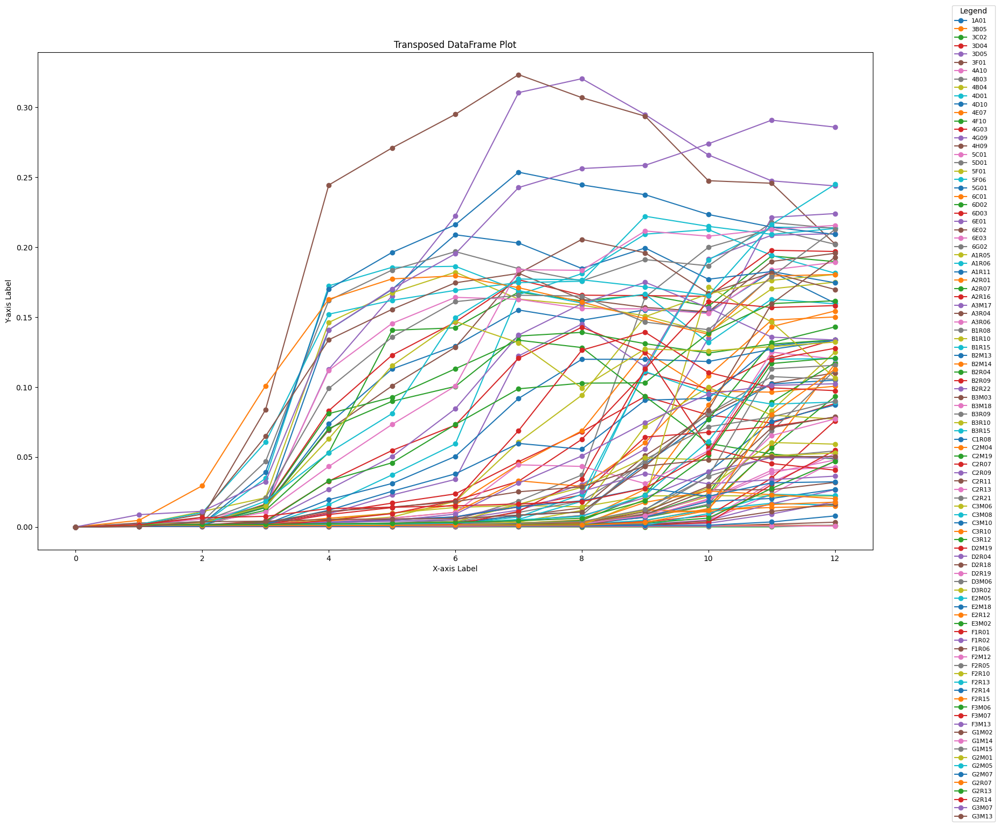

In [12]:
plot_transposed_df(a,plot_type='line',figsize=(20,12))


In [13]:
# create separate plots for each col in my dataframe
def separate_plot(df,sheet_name,x_values,df_transposed, plot_type='scatter',**kwargs):
    fig, axs = plt.subplots(12, 8, figsize=(40, 40), constrained_layout=True)  # 96 subplots in a 12x
    axs = axs.flatten() 
    for idx,col in enumerate(set(df_transposed.columns)):
        x_values= plot_time_x(df,sheet_name)
        
        ax= axs[idx]
        y_values = df_transposed[col].iloc[:,1]
        axs = axs.flatten()  # Flatten the 2D array of axes to 1D
        if plot_type == 'scatter':
            ax.scatter(x=x_values, y=y_values, marker='o', s=50, label=col, **kwargs)
        elif plot_type == 'line':
            ax.plot(x_values, y_values, label=col, **kwargs)
        else:
            raise ValueError(f"Unsupported plot type: {plot_type}")
        
        '''
        print('for ',col, ' len x is ',len(x_values))
        print(x_values)
        
        print('len y is',len(df_transposed[col].iloc[:,1]))
        '''
        ax.scatter(x=x_values, y = y_values, marker='o',s=50, label=col,**kwargs)
        
        ax.set_title(f'Carbon Source:{sheet_name} Strain:{col}',fontsize=14)
        ax.set_xlabel('Time(days)',fontsize=12)
        ax.set_ylabel("OD600",fontsize=12)
        #ax.legend(title='Legend', bbox_to_anchor=(1, 1), fontsize=8)
    plt.show()

0           0
1      0.0016
2     0.00165
3      0.0033
4     0.00165
5     0.00155
6      0.0016
7      0.0015
8      0.0015
9     0.00165
10     0.0018
11    0.00185
12      0.002
Name: 1A01, dtype: object


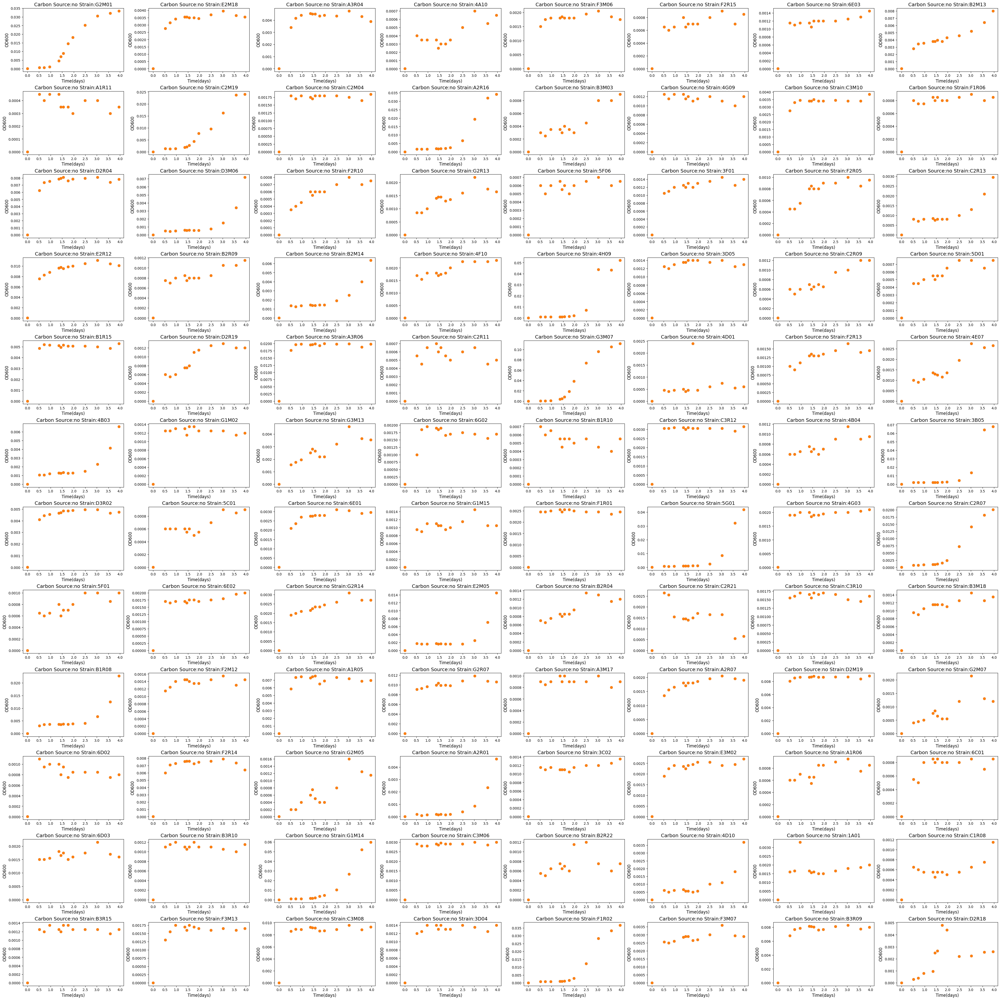

In [14]:
x_values_no_12 = plot_time_x(df_12, "no")

df_transposed_to_plot = transposed_df(df_12, 'no')
print(df_transposed_to_plot['1A01'].iloc[:,1])
# Plotting each column in a separate line plot
separate_plot(df_12,'no', x_values_no_12, df_transposed_to_plot)


/Users/liucheng/opt/anaconda3/envs/quant/lib/python3.9/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


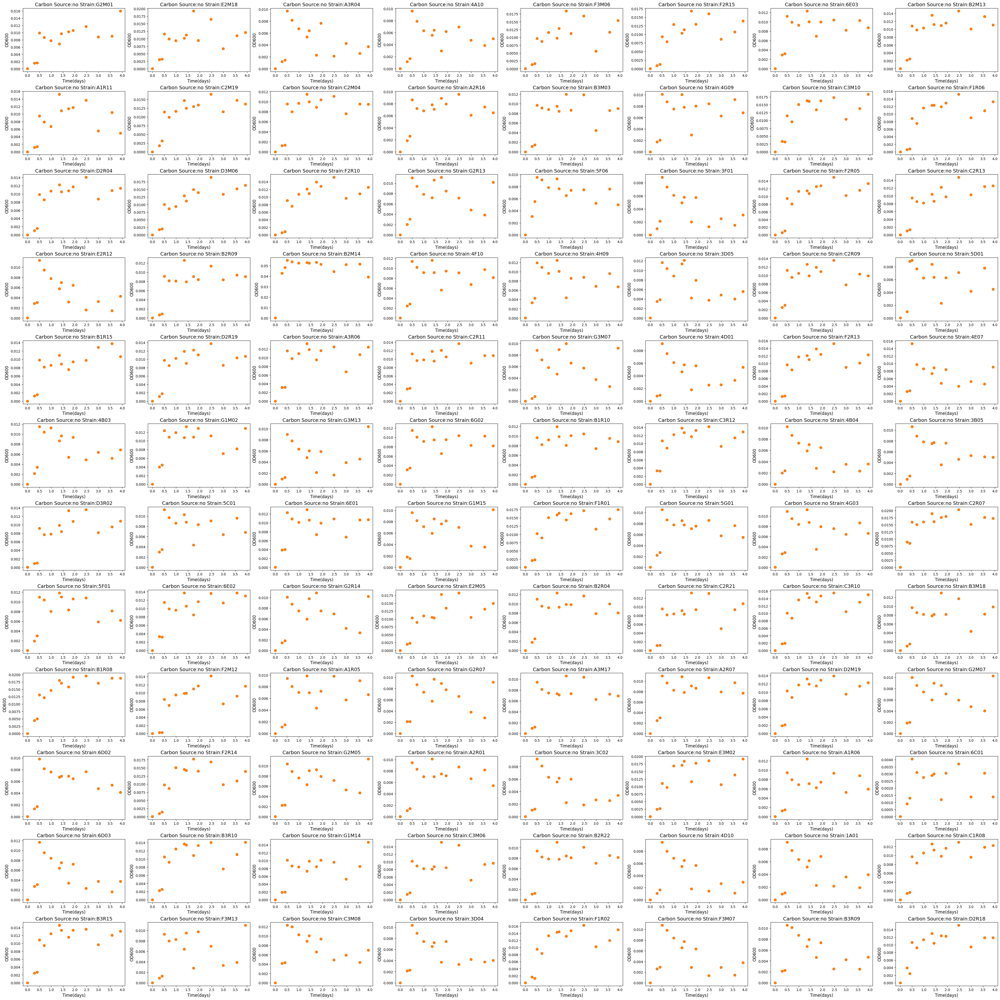

In [15]:
df_27 = pd.read_excel('/Users/liucheng/Desktop/Internship/Old_data Matti/raw data/timeseries 27C.xlsx', sheet_name=None,header=None)
x_values_no_27 = plot_time_x(df_27, "no")
#print(x_values_no_27)
#print(len(x_values_no_27))
df_transposed_to_plot_27 = transposed_df(df_27, 'no')
#print(df_transposed_to_plot_27['1A01'].iloc[:,1])
#print(len())
# Plotting each column in a separate line plot
separate_plot(df_27,'no', x_values_no_27, df_transposed_to_plot_27)

Processing sheet:MB


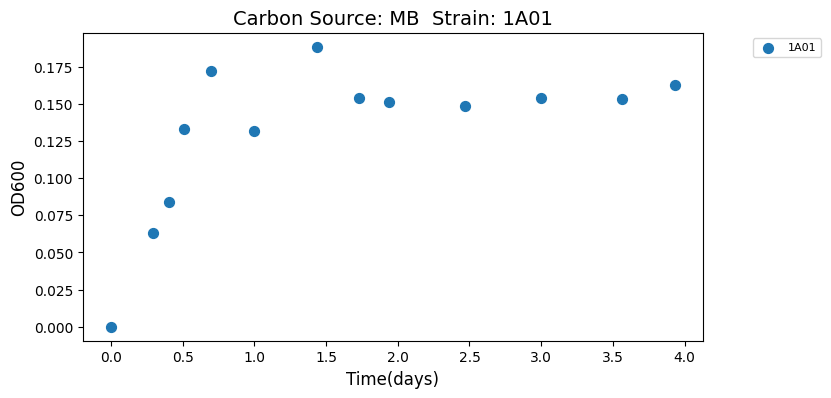

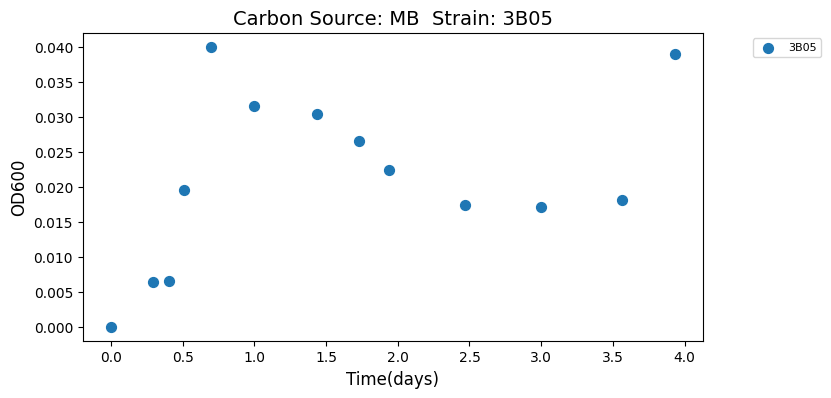

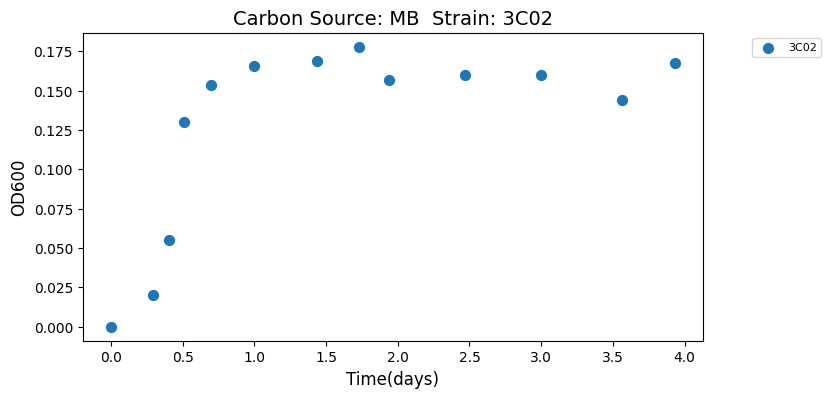

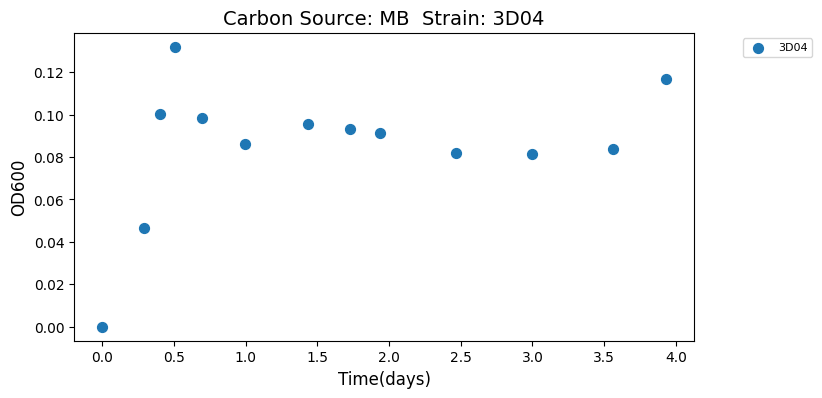

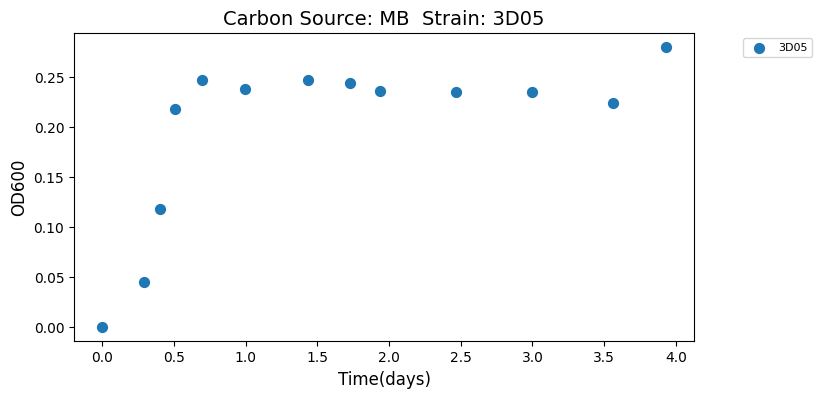

...

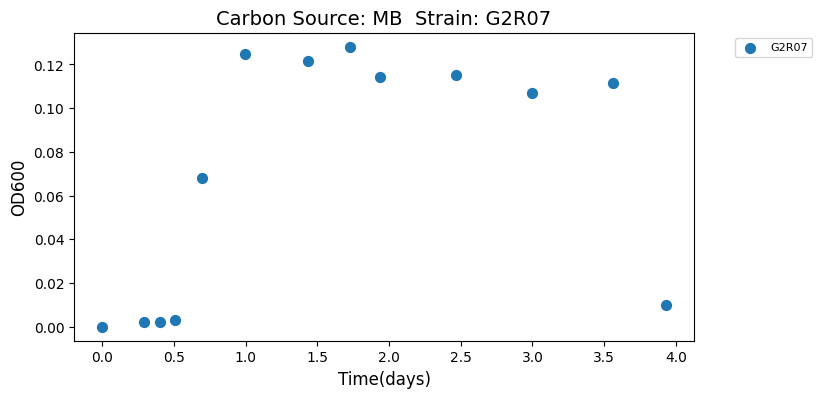

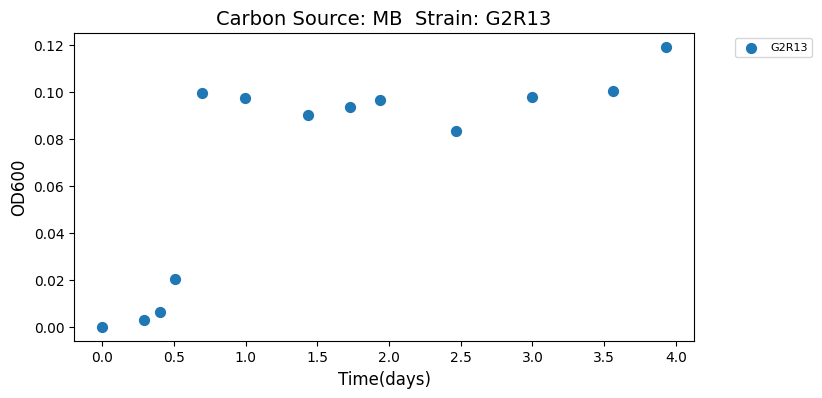

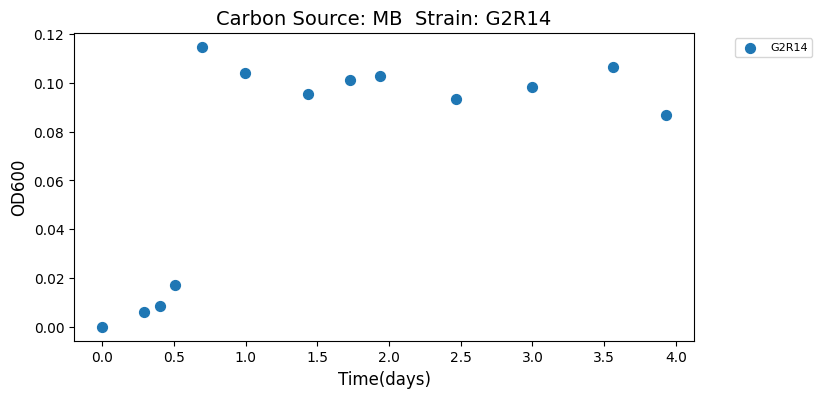

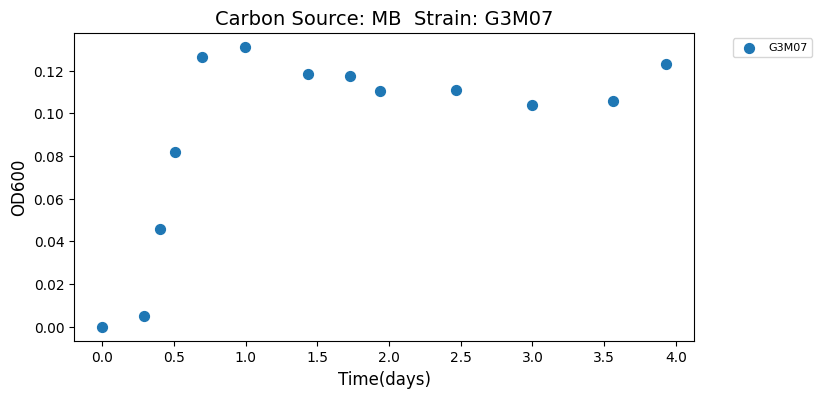

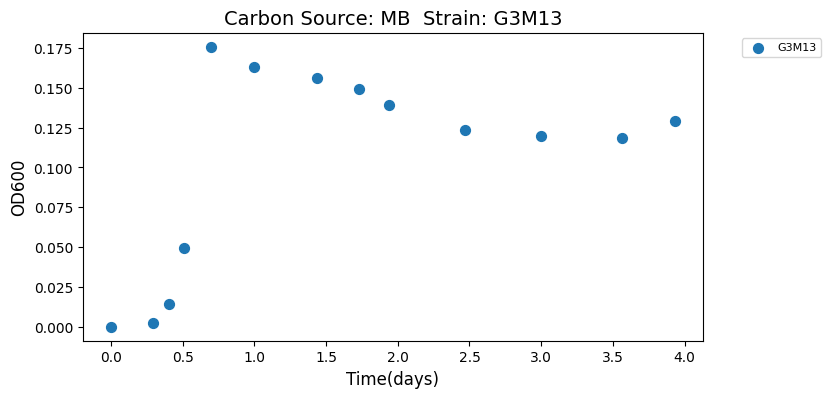

Processing sheet:glutamate


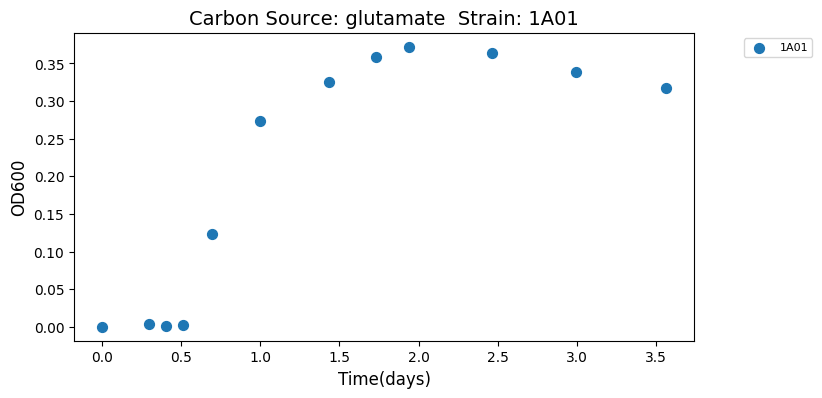

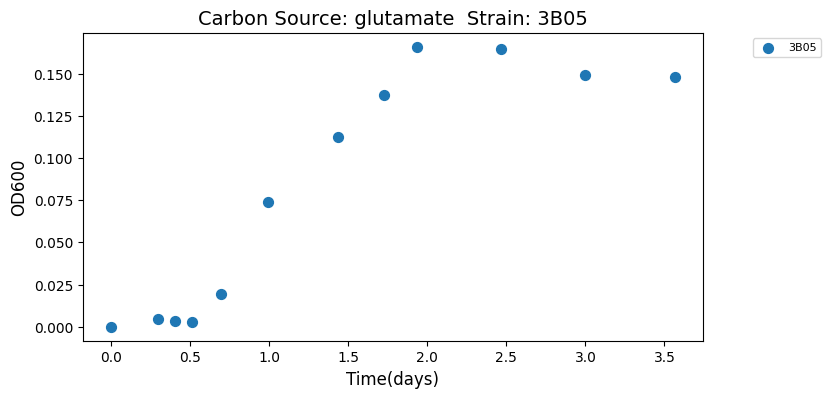

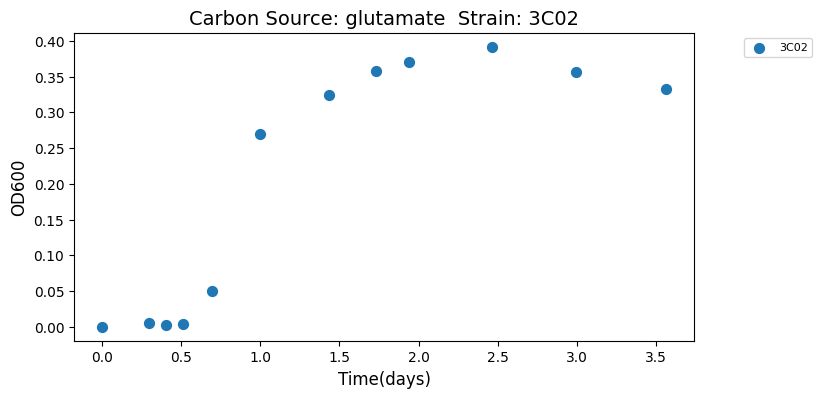

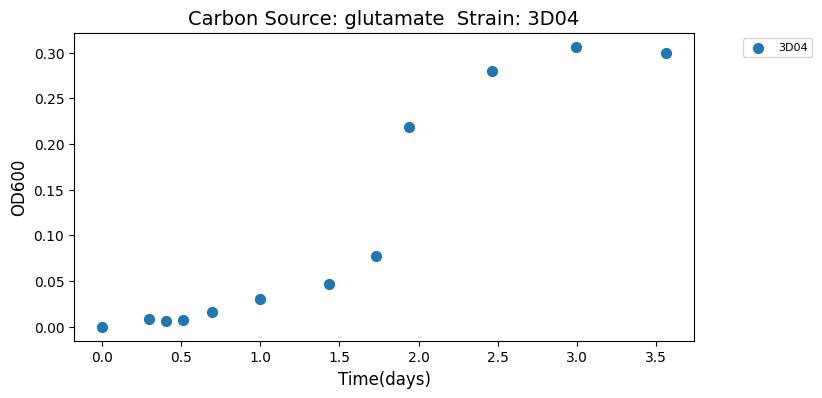

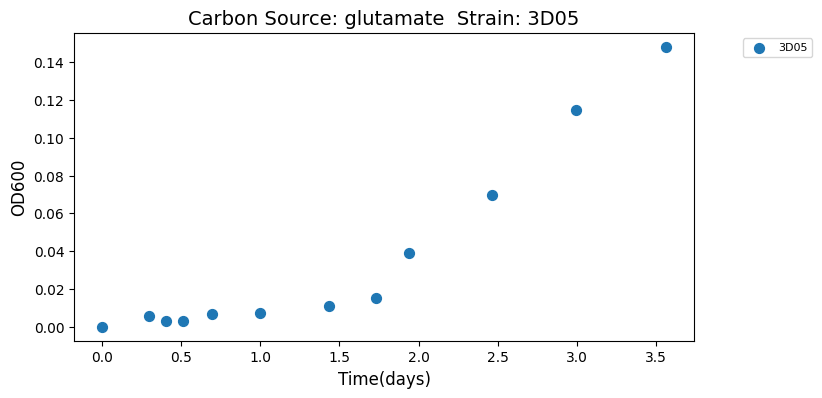

...

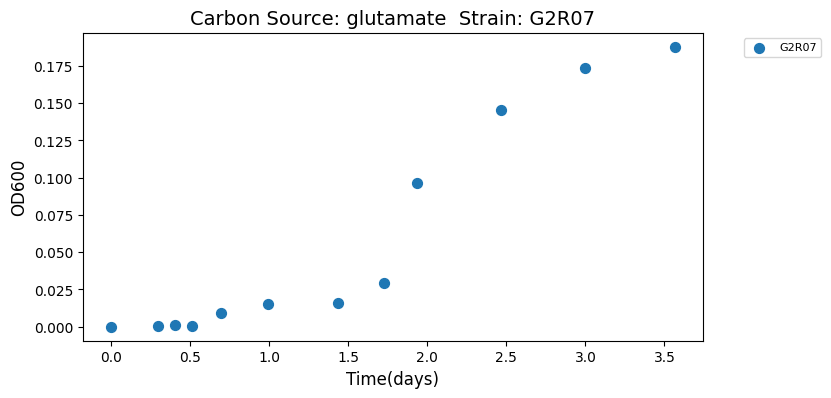

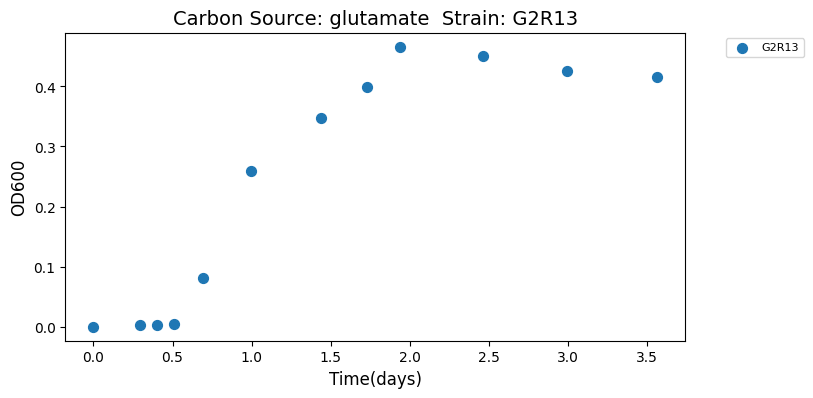

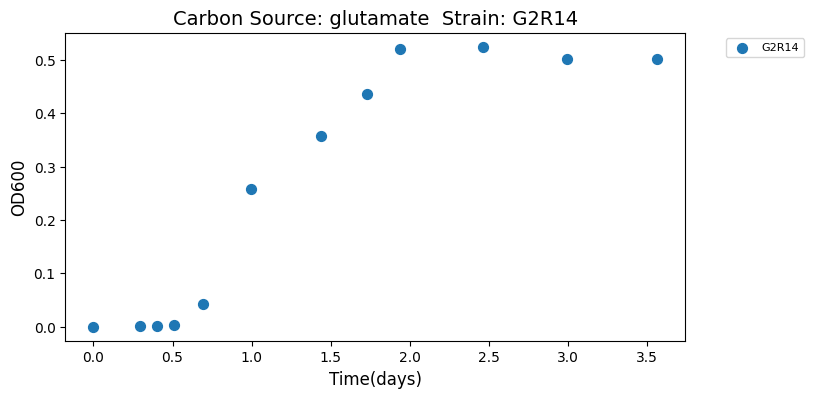

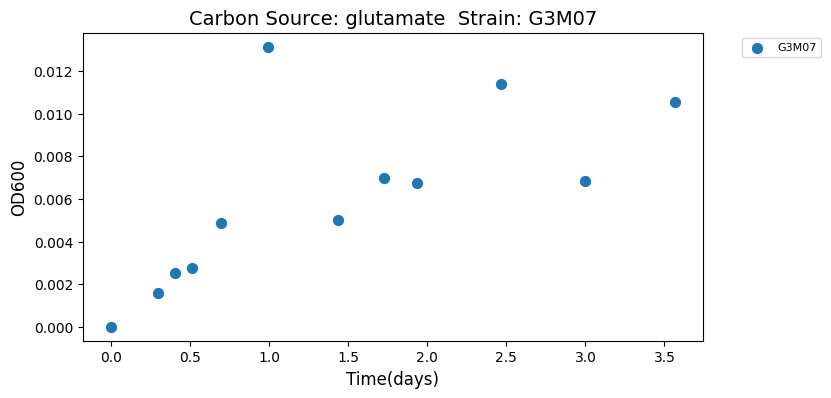

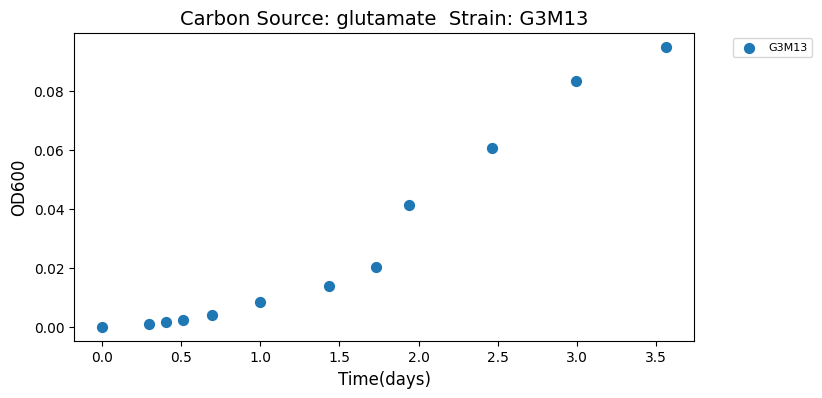

Processing sheet:pyruvate


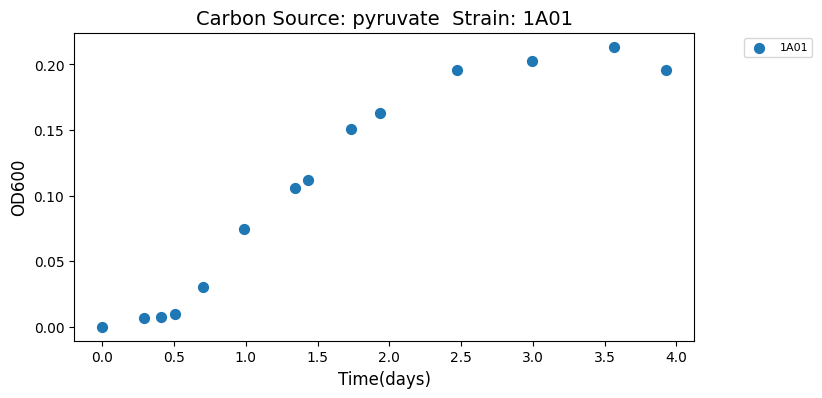

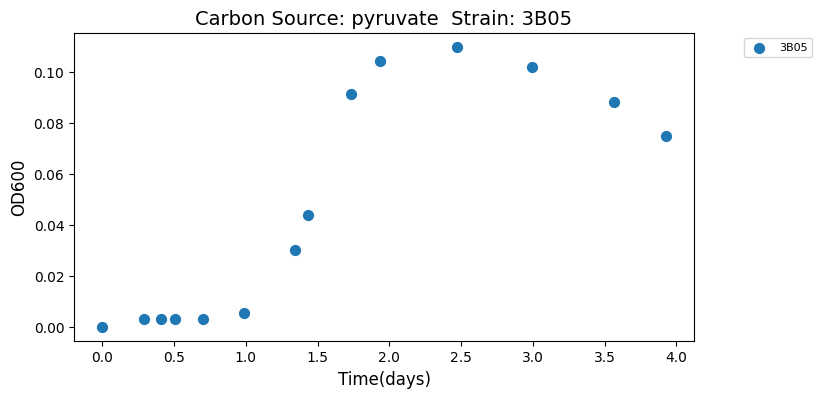

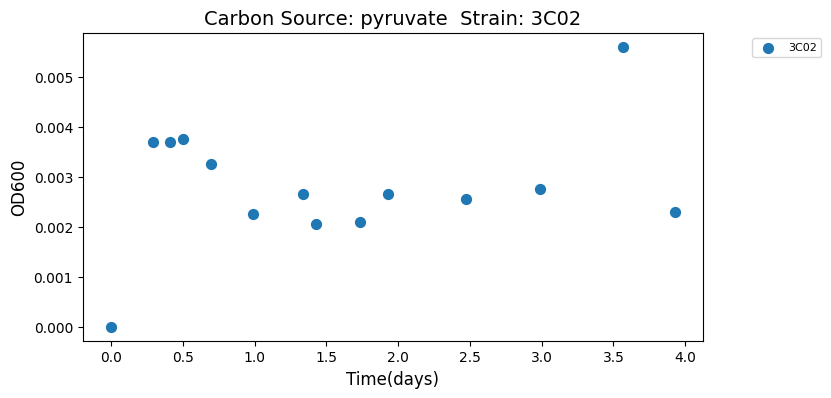

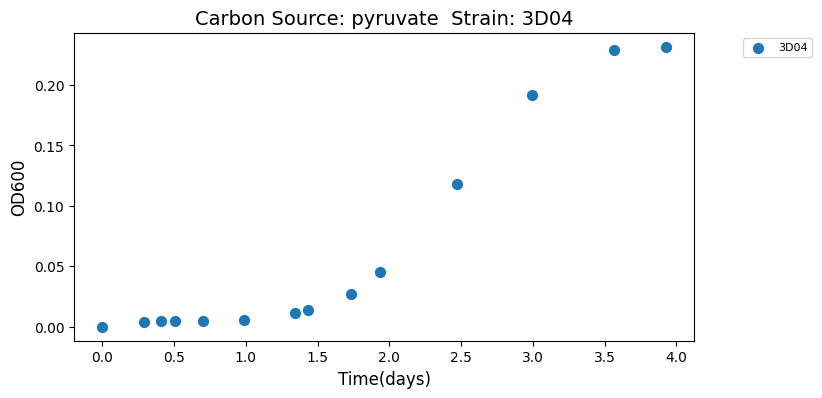

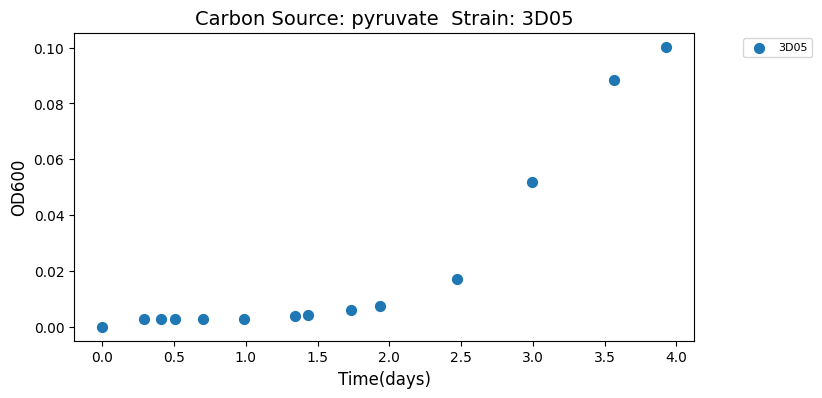

...

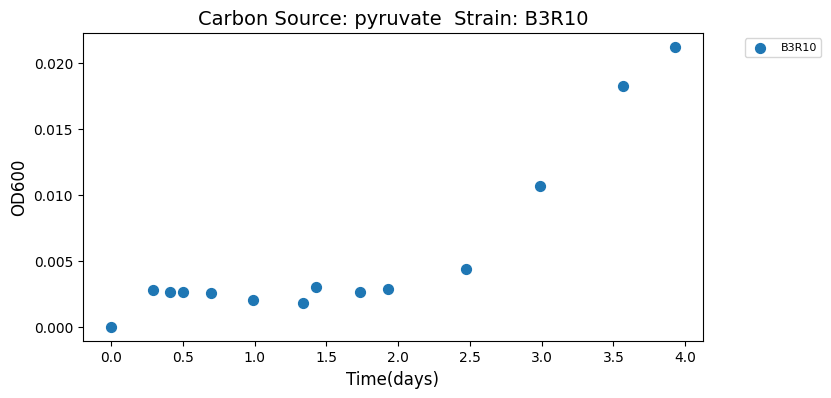

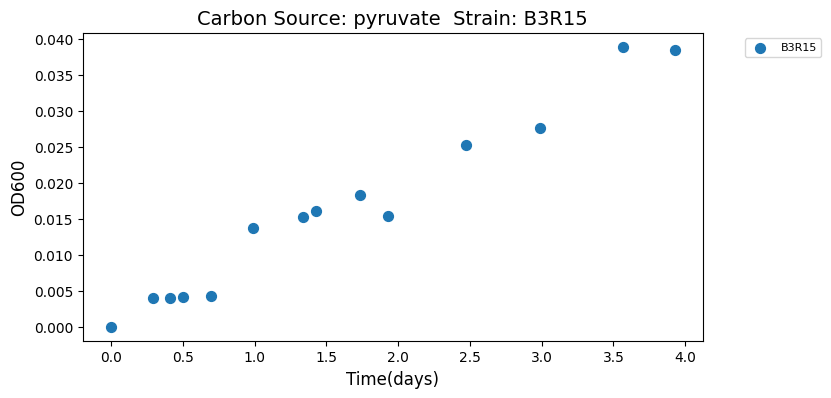

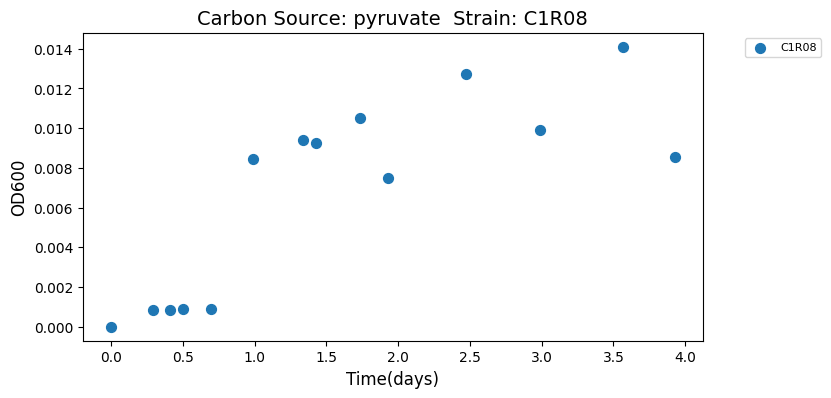

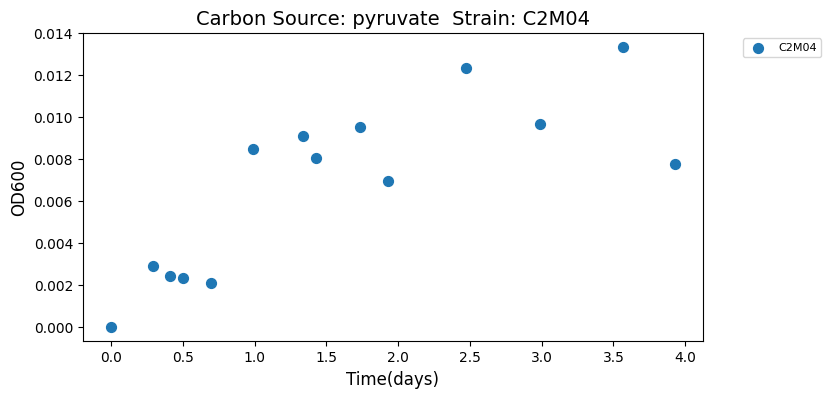

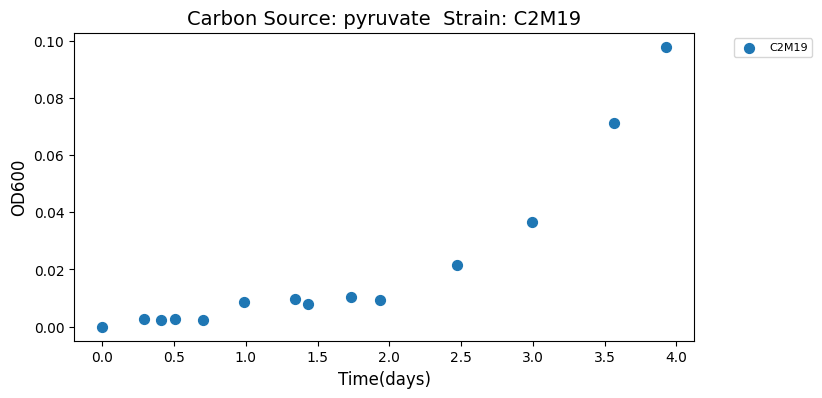

KeyboardInterrupt: 

In [16]:
class DataProcessor:
    def __init__(self, file_path):
        self.df = pd.read_excel(file_path, sheet_name = None,header= None)
        #self.label =None #initiliaze label as None
        self.label = self.init_label()
        #self.x_values = None
    
    def init_label(self):
        ret_map = {}
        for sheet_name in self.df.keys():
            if sheet_name not in ret_map:
                ret_map[sheet_name] = {}
            df_transposed= self.transposed_df(sheet_name)
            for col in df_transposed.columns:
                    current_label = df_transposed[col][0]
                    ret_map[sheet_name][col] = current_label
            
                    
        return ret_map
        
    def process_all_sheets(self):
        for sheet_name in self.df.keys():
            print(f"Processing sheet:{sheet_name}")
            x_values = self.plot_time_x(sheet_name)
            df_transposed_to_plot = self.transposed_df(sheet_name)
            #self.x_values = x_values # store x_values
            self.separate_plot(sheet_name, df_transposed_to_plot,x_values)
        
    def plot_time_x(self, sheet_name):
        df_sheet = self.df[sheet_name].copy()
        
        time_values= df_sheet.iloc[0,2:].reset_index(drop=True)
       
        # convert time_values to numeric
        numeric_time_values = pd.to_numeric(time_values,errors='coerce')
       
        return numeric_time_values
    
    def remove_redundant_time(self,sheet_name):
        df_sheet = self.df[sheet_name].copy()
        df_sheet.drop(df_sheet.index[::2], inplace=True)
        # reset index
        df_sheet.reset_index(drop=True, inplace=True)
        #print(df_sheet)
       
        return df_sheet
    
    def cleaned_df(self, sheet_name):
        processed_df= self.remove_redundant_time(sheet_name)
        processed_df = processed_df.drop(processed_df.columns[1],axis = 1)
        processed_df = processed_df.reset_index(drop=True)
        processed_df['new_index']= range(len(processed_df))
        processed_df.set_index('new_index',drop=True, inplace=True)
        
        return processed_df
    
    def transposed_df(self,sheet_name):
        # access the processed df using custom_name
        processed_data = self.cleaned_df(sheet_name)
    
        
        # Check if processed_data is None
        if processed_data is None:
            
            return None
    
        df_transposed =pd.DataFrame(processed_data.values.T,columns=processed_data.index).reset_index(drop=True)
        return df_transposed
# store the label from separate_plot
    
    def separate_plot(self, sheet_name, df_transposed,numeric_time_values, plot_type='scatter', **kwargs):
        for col in df_transposed.columns:
            x_values = numeric_time_values
           
            y_values = pd.to_numeric(df_transposed[col], errors='coerce')
            #print(x_values)
            #print(y_values)
            label = df_transposed[col][0]
            
            # assign label to class-level variable
            #self.label = label
                
            plt.figure(figsize=(8, 4))
            plt.scatter(x=x_values, y=y_values[1:], marker='o', s=50, label=label, **kwargs)
            plt.title(f'Carbon Source: {sheet_name}  Strain: {label}', fontsize=14)
            plt.xlabel('Time(days)', fontsize=12)
            plt.ylabel("OD600", fontsize=12)
            plt.legend(bbox_to_anchor=(1.2, 1), fontsize=8)
            plt.show()

# Create an instance of the DataProcessor class
data_processor = DataProcessor('/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /timeseries 27C.xlsx')
data_processor.process_all_sheets()

# # Apply the data processing functions
# x_values_MB_12 = data_processor.plot_time_x("MB")
# df_transposed_to_plot = data_processor.transposed_df('MB')

# # Plotting each column in a separate scatter plot
# data_processor.plot_transposed_df(df_transposed_to_plot, x_values_MB_12, plot_type='scatter', color='green')

        

In [ ]:
data_processor.label

In [ ]:
# Plotting each column in a separate scatter plot
x_values_MB = data_processor.plot_time_x('glcnac')
df_transposed_to_plot = data_processor.transposed_df('glcnac')
data_processor.separate_plot('glcnac', df_transposed_to_plot,x_values_MB, plot_type='scatter', color='green')


In [ ]:
df = data_processor.transposed_df('MB')


In [ ]:

label= list(df.iloc[0,:])

In [ ]:
# use interpolated od
from sklearn.metrics import mean_squared_error
class GrowthAnalysis:
    def __init__(self,file_path, sheet_name):
        
        self.data_processor = DataProcessor(file_path) # store the data_processor instance
        self.sheet_name =sheet_name 
       
        self.mgrdf = pd.DataFrame(index=self.data_processor.label[sheet_name].values(),columns = [self.sheet_name]) # initialize the dataframe
        #self.x_values = self.data_processor.plot_time_x(sheet_name)
        self.od_values = {}
        self.time_points = self.data_processor.plot_time_x(sheet_name)
    
        
        #self.interpolated_time ={}
        #self.interpolated_od = {}
        
#       # def separate_plot(self, sheet_name, df_transposed,numeric_time_values, plot_type='scatter', **kwargs):
#         for col in df_transposed.columns:
#             x_values = numeric_time_values
           
    
    
#             y_values = pd.to_numeric(df_transposed[col][1:], errors='coerce')
#             print(x_values)
#             print(y_values)
#             label = df_transposed[col][0]
        self.label = self.data_processor.label # use label from data_processor instance
    
    def process_all_sheets(self):
        for sheet_name in self.data_processor.df.keys():
            print(f"Processing sheet :{sheet_name}")
            for col in self.data_processor.transposed_df(sheet_name).columns:
                self.curve_process(sheet_name, col)
                self.store_mgr(sheet_name, col ,target_file)
            
    def curve_process(self,sheet_name, col):
        #self.time_points = data_processor.plot_time_x(sheet_name)
        #od_values = data_processor.transposed_df(sheet_name)[1:]
        self.od_values[col] = self.data_processor.transposed_df(sheet_name)[1:][col].reset_index(drop=True)
       
       
    def max_growth_rate(self,col):
    
        '''obtain the initial guess of the mgr''' 
        # check if the max OD for the given col is less than 0.08
        if max(self.od_values[col])<0.08:
            return None
        # calculate mgr using a sliding window of 4 data points
        stop =len(self.time_points)-3
        mgr = 0
        
        for idx in range(1,stop):
            #print("Index:", idx)
            #print("Length of time_points:", len(self.time_points))
            #print("Length of od_values:", len(self.od_values))
            ya = self.od_values[col][idx] if idx < len(self.od_values[col]) else None
            if ya is None:
                continue
            yb = self.od_values[col][idx + 2] if idx + 2 < len(self.od_values[col]) else None
            if yb is None:
                continue
            
            if ya <= 0:
                ya = 0.001
            if yb <= 0:
                yb = 0.001
            if yb <=ya:
                continue
            gr = ((np.log(yb/ya)) /
                  (self.time_points[idx + 2] - self.time_points[idx]))
            
            if  gr > mgr:
                mgr = gr
            
                
                
                
#         for idx in range(len(self.od_values)):
#             mgr, λ = self.max_growth_rate()  # Call max_growth_rate for each column separately
            #print("For column", idx, ":", mgr)
        return mgr
    
    def store_mgr(self, sheet_name, col ,target_file):
        mgr = self.max_growth_rate(col)
        print(mgr)
        if self.label[sheet_name][col] not in list(self.mgrdf.index):
            self.mgrdf.loc[self.label[sheet_name][col], sheet_name]= np.nan
        else:
            self.mgrdf.loc[self.label[sheet_name][col], sheet_name] = mgr
        print(self.mgrdf)
        
        print(f'Writing to {target_file}')
        self.mgrdf.to_csv(target_file)
    
   

In [ ]:
def process_and_save(sheet_names, target_file):
    if sheet_names:
        first_sheet_name = sheet_names[0]
        growth_analysis = GrowthAnalysis(file_path, first_sheet_name)
        for sheet_name in sheet_names:
            df_transposed = growth_analysis.data_processor.transposed_df(sheet_name)
            for col in df_transposed.columns:
                
                growth_analysis.curve_process(sheet_name, col)
                growth_analysis.store_mgr(sheet_name,col,target_file)
# Define sheet names and target files
file_path = '/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /timeseries 27C.xlsx'
sheet_names_1 = ['MB']
sheet_names_2 = ['glutamate']
sheet_names_3 = ['pyruvate', 'alanine', 'acetate', 'succinate', 'asparagine', 'leucine', 'glcnac', 'no']

target_file1 = '/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /mgr_27_closest_1.csv'
target_file2 = '/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /mgr_27_closest_2.csv'
target_file3 = '/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /mgr_27_closest_3.csv'

# Process and save for each group
process_and_save(sheet_names_1, target_file1)
process_and_save(sheet_names_2, target_file2)
process_and_save(sheet_names_3, target_file3)
df1 = pd.read_csv(target_file1)
df2 = pd.read_csv(target_file2)
df3 = pd.read_csv(target_file3)

combined_df = pd.merge(df1,df2,how='outer')
combined_df = pd.merge(combined_df,df3,how='outer')
combined_df.to_csv('/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined27_without_modeling.csv', index =False)

In [ ]:
df1 = pd.read_csv(target_file1)
df2 = pd.read_csv(target_file2)
df3 = pd.read_csv(target_file3)

combined_df = pd.merge(df1,df2,how='outer')
combined_df = pd.merge(combined_df,df3,how='outer')

In [ ]:
combined_df.to_csv('/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined22_without_modeling.csv', index =False)

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
from scipy.optimize import curve_fit

In [18]:
class ActivationEnergy:
    def __init__(self,file_paths, temperatures):
        self.file_paths = file_paths
        self.temperatures = temperatures
        self.mgr_dics = []
        self.rows = []
        self.cols= []
        
    def get_mgr_dics(self):
        df_list = []
            
        for file_path in self.file_paths:
            df = self.read_mgrfile(file_path)
            df_list.append(df)

        columns = df_list[0].columns[:]
        rows = df_list[0].index.tolist()
        for idx, (file_path, temperature) in enumerate(zip(self.file_paths, self.temperatures)):
            #df = self.read_mgrfile(file_path)
            #temperature = np.array(temperature) # Ensure temperature is an array

            for col in columns:
                for row in rows:
                    mgr_dic = {}
                    idx1 = 0
                    for df in df_list:
                        mgr = df.loc[row,col]
                        mgr = float(mgr)
                        if not pd.isnull(mgr) and np.isfinite(mgr) and mgr>0:
                            mgr_dic[idx1]=mgr
                            #self.arrhenius_equation(mgr)
                            #print(f'Calculating activation energy for Strain:{idx}, Carbon Source:{col}')
                        else:
                            #self.arrhenius_equation()
                            #mgr_list.append()
                            print(f'Invalid value for Carbon Source: {col}')
                        idx1 +=1
                    #print(f'Calculating activation energy for Strain: {row}, Carbon Source:{col}')
                    #print(mgr_dic)
                    self.rows.append(row)
                    self.cols.append(col)
                    self.mgr_dics.append(mgr_dic)
                    #print(f'Calculating activation energy for Strain: {row}, Carbon Source:{col}')
        
    # using Arrhenius equation to extract activation energy 
  
  
    def curve_fitting(self,mgr_dic,idx):
        def model_func(temperatures, a, b, c):
            R = 8.314 # J/mol*K
            T = temperatures # Convert to K
            return -a * np.log(T) - b * T + c
        
        mgr = list(mgr_dic.values())
        #print('mgr_dic values',mgr)
        if len(mgr)< 4:
            return 
        T = np.array(self.temperatures)
        
        # Perform curve fitting
        params, params_covariance = curve_fit(model_func, T, mgr)

        # Generate curve fit values for plotting
        temperature_fit = np.linspace(min(T), max(T), 100)
        growth_rate_fit = model_func(temperature_fit, *params)
        
        # calculate r-squared value
        residuals = mgr - model_func(T, *params)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((mgr-np.mean(mgr))**2)
        r_squared = 1- (ss_res/ss_tot)
        if r_squared > 0.85 and self.rows[idx]=="1A01" :
            plt.figure(figsize=(8,6))
            plt.scatter(1/T, mgr)
            plt.plot(1/temperature_fit, growth_rate_fit, color='red', label='Fitted Curve')
            plt.ylabel('µ (h-1)')
            plt.legend()
            plt.title(f'Strain:{self.rows[idx]} Carbon Source:{self.cols[idx]} $R^2$:{r_squared:.4f}')
            #plt.text(0.05, 0.95, f'r2 = {r_squared:.4f}',transform = plt.gca().transAxes, fontsize=12, verticalalignent='top')
            plt.grid(True)
            plt.show()

            # Print the fitted parameters
            #print(f"Fitted parameters: a = {params[0]}, b = {params[1]}, c = {params[2]}")

        
        
    def read_mgrfile(self,path):
        df = pd.read_csv(path)
        df.set_index('Unnamed: 0',inplace = True)
        
        return df


        

Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Sou

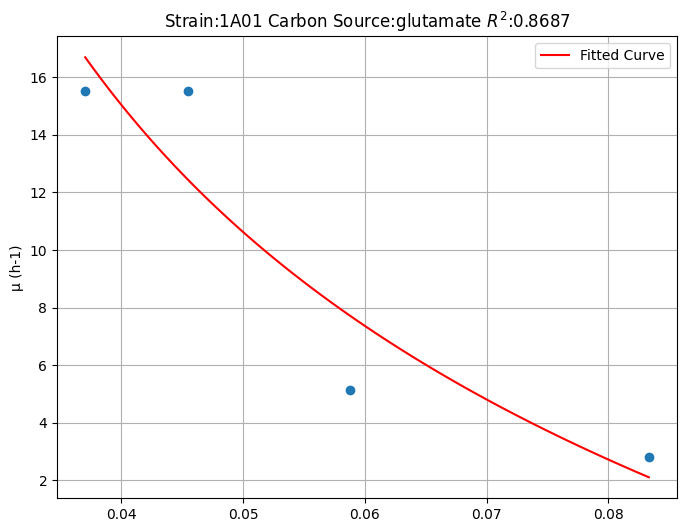

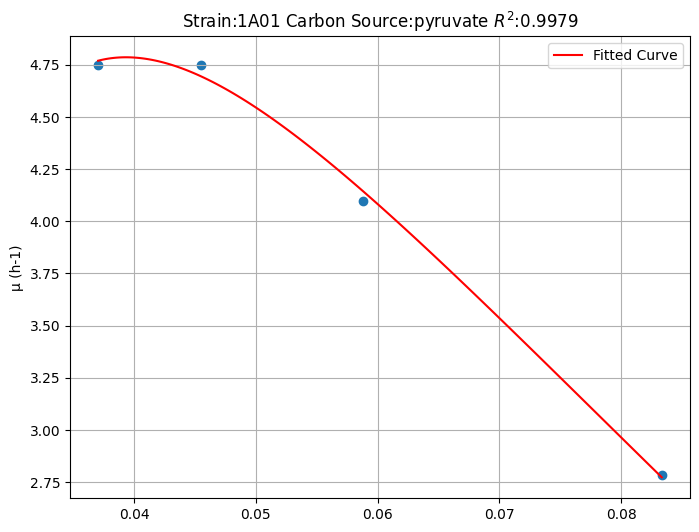

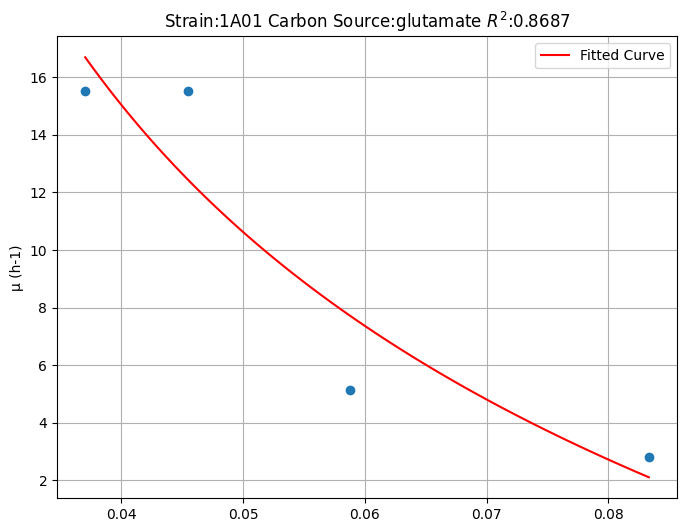

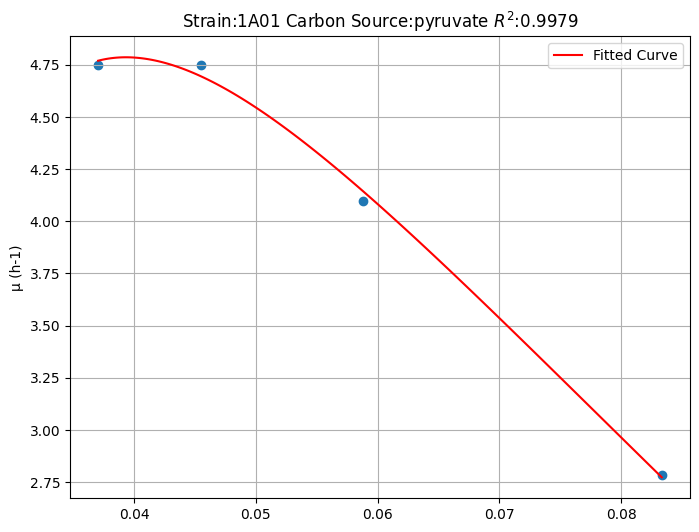

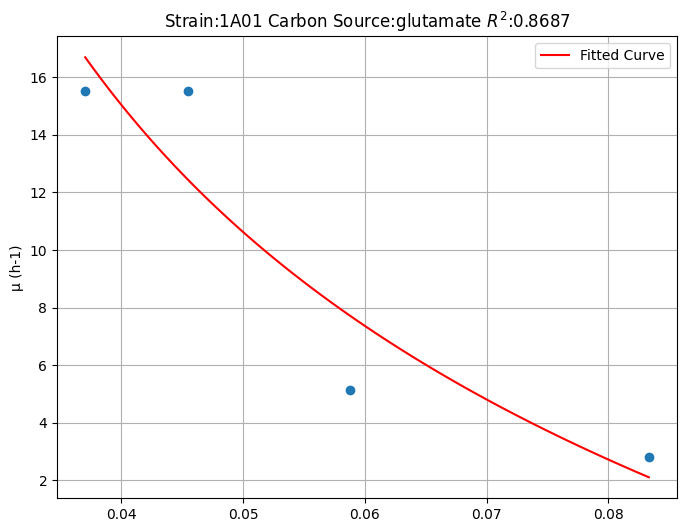

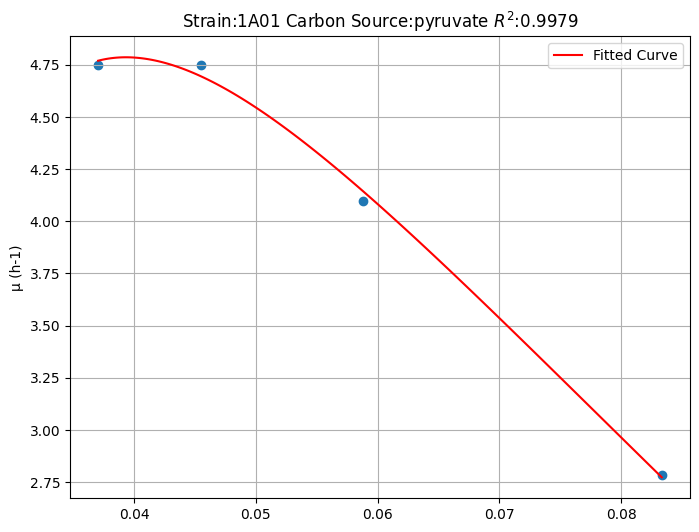

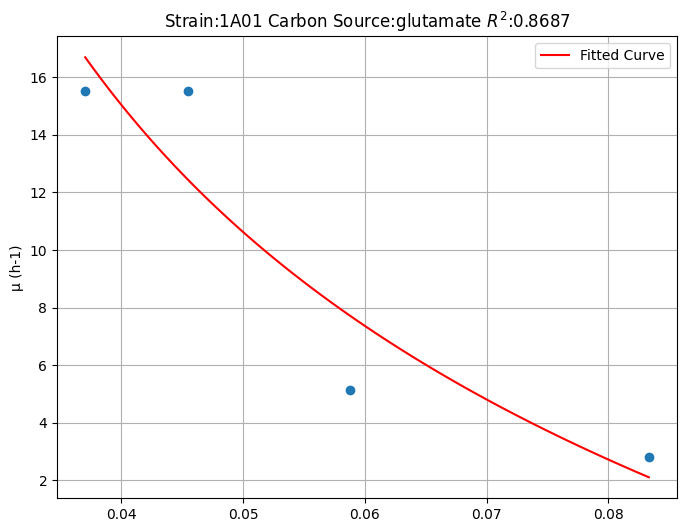

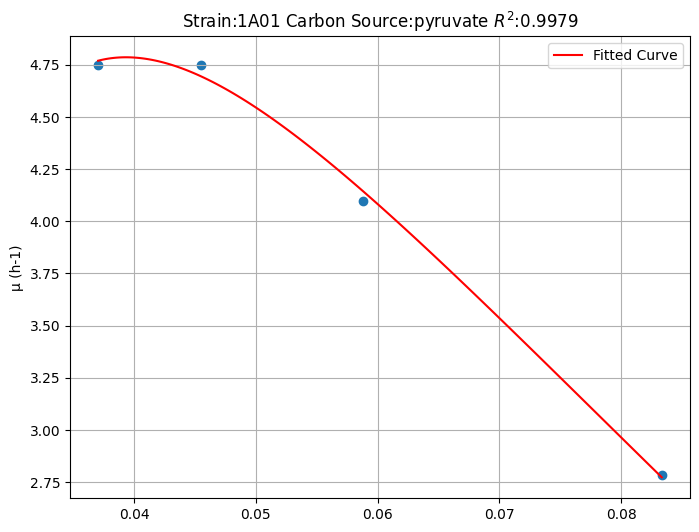

In [19]:
# Example usage
file_paths =['/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined12_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined17_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined22_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined27_without_modeling.csv']
temperatures = [12,17,22,27]
# Given data


activation_energy_calculator = ActivationEnergy(file_paths, temperatures)
activation_energy_calculator.get_mgr_dics()
mgr_dics = activation_energy_calculator.mgr_dics
for k in range(len(mgr_dics)):
    activation_energy_calculator.curve_fitting(mgr_dics[k],k)
    


In [22]:
# def hinshelwood_model(T,k1,E1,k2, E2):
#     R = 8.314
#     return k1*np.exp(-E1/(R*T))-k2*np.exp(-E2/(R*T))

In [24]:
# Example usagefied /combined17_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined22_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined27_without_modeling.csv']
file_paths =['/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined12_6_9_0.85.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined17_6_9_0.85.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined22_6_9_0.85.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined27_6_9_0.85.csv']
temperatures = [12,17,22,27]
# Given data


activation_energy_calculator = ActivationEnergy(file_paths, temperatures)
activation_energy_calculator.get_mgr_dics()
mgr_dics = activation_energy_calculator.mgr_dics
for k in range(len(mgr_dics)):
    activation_energy_calculator.curve_fitting(mgr_dics[k],k)
    


Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Source: MB
Invalid value for Carbon Sou

In [25]:
import pandas as pd

df1=pd.read_csv('/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined12_without_modeling.csv')
df1.columns
carbon_sources = df1.columns.to_list()[1:]
carbon_sources
#carbon_sources=p


['MB',
 'glutamate',
 'pyruvate',
 'alanine',
 'acetate',
 'succinate',
 'asparagine',
 'leucine',
 'glcnac',
 'no']

In [26]:
strains = df1['Unnamed: 0'].to_list()


In [27]:
df1[df1['Unnamed: 0']=='1A01']['MB']

0    4.949942
Name: MB, dtype: float64

In [28]:
def read_file(temp):
    file_path = '/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined'+str(temp)+'_without_modeling.csv'
    df = pd.read_csv(file_path)
    return df
    

In [29]:
read_file(17)

,Unnamed: 0,MB,glutamate,pyruvate,alanine,acetate,succinate,asparagine,leucine,glcnac,no
0,1A01,9.853843,5.137279,4.098357,NaN,NaN,6.003416,NaN,NaN,6.297375,NaN
1,3B05,NaN,2.089841,3.843101,4.450952,4.404135,6.104930,3.886650,NaN,NaN,NaN
2,3C02,11.430406,6.732641,5.691712,NaN,NaN,6.673432,NaN,NaN,7.853228,NaN
3,3D04,7.534264,1.472129,2.040634,NaN,3.386635,NaN,NaN,NaN,NaN,NaN
4,3D05,10.046784,NaN,3.442137,NaN,NaN,5.035536,NaN,NaN,4.394299,NaN
...,...,...,...,...,...,...,...,...,...,...,...
91,G2R07,5.885910,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92,G2R13,4.706773,3.566162,3.564382,2.746475,3.700820,4.325702,2.210730,NaN,NaN,NaN
93,G2R14,4.720736,3.559020,2.658843,3.118121,3.494947,5.223496,3.970101,NaN,NaN,NaN
94,G3M07,11.601912,NaN,4.331847,3.836570,5.586920,8.523958,NaN,NaN,6.873962,NaN


In [30]:

# Example usage
file_paths =['/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined12_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined17_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined22_without_modeling.csv','/Users/liucheng/Desktop/Internship/Old_data Matti/raw data modified /combined27_without_modeling.csv']
temperatures = [12,17,22,27]
# Given data

carbon_strain_dic={}

for carbon_source in carbon_sources:
    carbon_strain_dic[carbon_source]={}
    for temp in temperatures:
        carbon_strain_dic[carbon_source][temp] = []
    for strain in strains:
    
        for temp in temperatures:
            cur_file = read_file(temp)
            cur_mgr = cur_file[cur_file['Unnamed: 0']==strain][carbon_source].item()
            carbon_strain_dic[carbon_source][temp].append(cur_mgr/24)
            
    
    
    

In [31]:
carbon_strain_dic['MB'][12]

[0.20624760222945962,
 0.13020329394323762,
 0.22526107811205512,
 0.17861366262323197,
 0.2505291011225959,
 0.3632492897729986,
 0.16546012718139713,
 0.24937978257516377,
 0.23712359118841486,
 0.29479799537728724,
 0.11450458869289516,
 0.09890026748340242,
 0.08165355576225984,
 0.23892117401554833,
 0.26980384973467375,
 0.15196313972028302,
 0.10156121234454435,
 0.08771003161063164,
 0.09154822064114954,
 0.07584236540413196,
 0.25240057248404296,
 0.2012608495050809,
 0.30670409762518175,
 0.18179649656811867,
 0.1488966290621864,
 0.19536961930568852,
 0.1977454563020542,
 0.02204451100593972,
 0.20978344074525865,
 0.2985188035476752,
 0.3146328071016815,
 0.21871257075424208,
 0.12276954364189174,
 0.13832587516637976,
 0.06719606523411971,
 0.07168375303815533,
 0.07839686260543337,
 0.17747533067189872,
 0.33962759760776323,
 0.22411684327586967,
 0.2426497717893155,
 0.1247408662665395,
 0.12106363341042815,
 0.0869928698178435,
 0.07998432721532203,
 0.07663158712026617

In [32]:
data ={
    'carbon_source' :[],
    'temperature':[],
    'mgr':[]
}
for carbon_source, temps in carbon_strain_dic.items():
    for temp, max_mgr in temps.items():
        data['carbon_source'].extend([carbon_source]*len(max_mgr))
        data['temperature'].extend([temp]*len(max_mgr))
        data['mgr'].extend(max_mgr)
df_plot = pd.DataFrame(data)
df_plot                                   

,carbon_source,temperature,mgr
0,MB,12,0.206248
1,MB,12,0.130203
2,MB,12,0.225261
3,MB,12,0.178614
4,MB,12,0.250529
...,...,...,...
3835,no,27,NaN
3836,no,27,NaN
3837,no,27,NaN
3838,no,27,NaN


In [33]:
df_plot[df_plot['carbon_source']=='no'].max()

carbon_source          no
temperature            27
mgr              0.237669
dtype: object

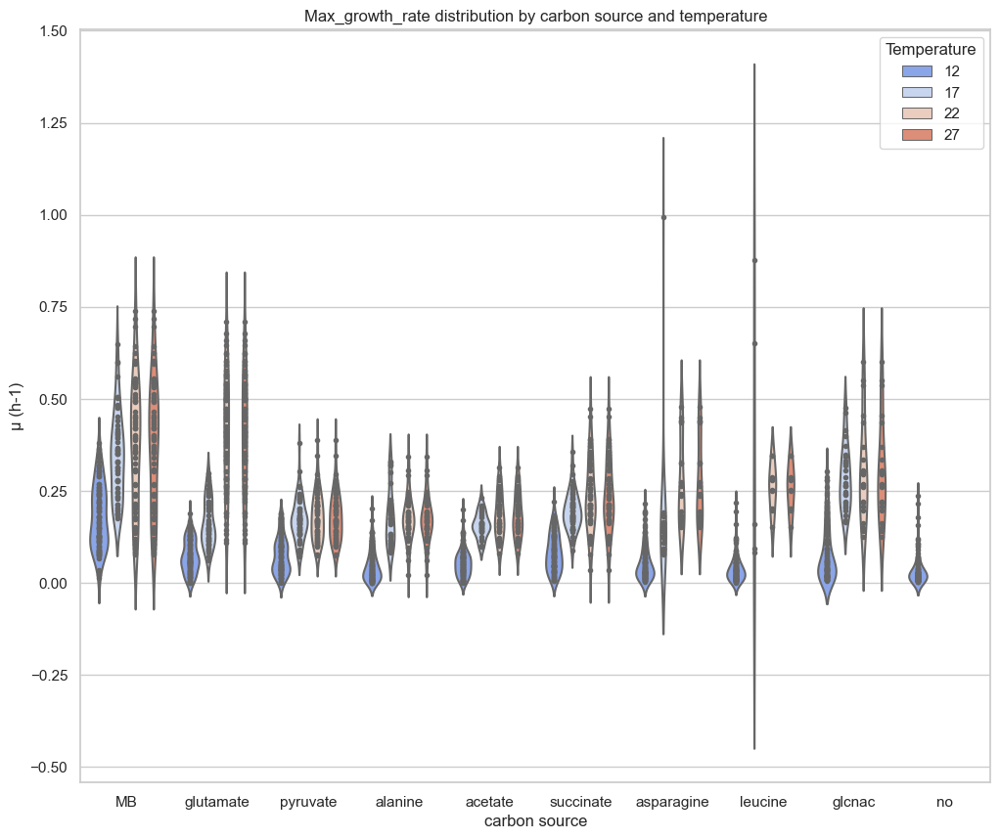

In [34]:
# draw violin plot
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style = 'whitegrid')
plt.figure(figsize=(12,10))

# inner = point display actual data points
sns.violinplot(x='carbon_source', y='mgr',hue='temperature',data = df_plot,inner='point',palette='coolwarm')
plt.title('Max_growth_rate distribution by carbon source and temperature')
plt.xlabel('carbon source')
plt.ylabel('µ (h-1)')

plt.legend(title='Temperature')

plt.savefig('/Users/liucheng/Desktop/My_thesis_2024/Plots/violin_carbon_source.pdf', format = 'pdf')
plt.show()

In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.set(style = 'whitegrid')
# plt.figure(figsize=(12,10))

# # inner = point display actual data points
# #sns.violinplot(x='carbon_source', y='mgr',hue='temperature',data = df_plot,inner=None,palette='coolwarm')
# # Overlay the stripplot with adjusted point size
# sns.stripplot(x="carbon_source", y="mgr", hue='temperature',data=df_plot, size=5, alpha=0.5,palette='coolwarm')  # Adjust 'size' for point size

# plt.title('Max_growth_rate distribution by carbon source and temperature')
# plt.xlabel('carbon source')
# plt.ylabel('µ (h-1)')

# plt.legend(title='Temperature')

# plt.savefig('/Users/liucheng/Desktop/My_thesis_2024/Plots/violin_carbon_source.pdf', format = 'pdf')
# plt.show()

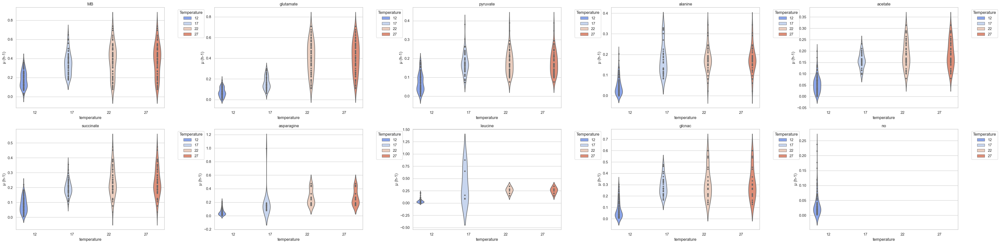

In [35]:
# draw violin plot
import seaborn as sns
import matplotlib.pyplot as plt

num_carbon_sources = len(df_plot['carbon_source'].unique())
fig, axes = plt.subplots(2,5, figsize=(40,10))

for idx,cs in enumerate(df_plot['carbon_source'].unique()):
    
    row= idx//5
    col = idx%5
    ax = axes[row, col]
    sns.set(style = 'whitegrid')
    
    sns.violinplot(x='temperature', y='mgr',hue='temperature',data = df_plot[df_plot['carbon_source']==cs],inner='point',palette='coolwarm', ax=ax)
    ax.set_title(cs)
    ax.set_xlabel('temperature')
    ax.set_ylabel('µ (h-1)')
    ax.legend(title='Temperature', loc = 'upper right',bbox_to_anchor=(1.28, 1))
# Adjust layout to make room for the legend
plt.subplots_adjust(
    left=0.1, right=0.8, top=0.9, bottom=0.1,
    wspace=0.4,  # Space between columns
    hspace=0.4   # Space between rows
)   
plt.savefig('/Users/liucheng/Desktop/My_thesis_2024/Plots/violin_temperature.pdf', format = 'pdf')    
plt.tight_layout()
plt.show()